In [1]:
import os
import argparse
from tqdm.auto import tqdm
import json

import torch
from accelerate import Accelerator
import matplotlib.pyplot as plt

import sys

from constant import *

from pipeline_stable_diffusion_mask import StableDiffusionMaskPipeline
from mask_attention_processor_test import MaskAttnProcessor2_0
from set_attn_proc import set_mask_attn
from diffusers import StableDiffusionPipeline

In [2]:
use_mindiff = True
use_soft_mask = False
use_ppl = False
prompt_type = "no_pose_prompt"
prompt = "a sks dog wearing a red scarf"
pre_prompt = "a sks dog"

num_samples = 5
if use_soft_mask:
    mask = "soft"
else:
    mask = "hard"

subject = "dog5"
if use_ppl:
    custom_model_name = "custom-model-ppl-single"
else:
    custom_model_name = "custom-model-800step"

custom_model_path = f"/file-path/{custom_model_name}/{subject}"
mask_token = "sks"
modifier_token = "sks"
device = "cuda"
seed = 43
num_inference_steps = 50

In [3]:
if use_mindiff:
    # load pipeline
    pipeline = StableDiffusionMaskPipeline.from_pretrained(
        custom_model_path,
    )
    pipeline.safety_checker = None
    unet = pipeline.unet
    unet = set_mask_attn(
        unet=unet,
        use_soft_mask=use_soft_mask
    )
    # pipeline.unet = register_cross_attention_hook(pipeline.unet)
    mask_token_id = pipeline.tokenizer.convert_tokens_to_ids(f"{mask_token}</w>")
else:
    pipeline = StableDiffusionPipeline.from_pretrained(
        custom_model_path,
    )
    pipeline.safety_checker = None

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [4]:
pipeline.to(device)
generator = torch.Generator(device=device).manual_seed(seed)

num_samples = 5

from diffusers.utils.torch_utils import randn_tensor
batch_size = 1 * num_samples
num_channels_latents = pipeline.unet.config.in_channels
height = int(pipeline.unet.config.sample_size * pipeline.vae_scale_factor) // pipeline.vae_scale_factor
width = int(pipeline.unet.config.sample_size * pipeline.vae_scale_factor) // pipeline.vae_scale_factor
shape = (batch_size, num_channels_latents, height, width)
latents = randn_tensor(shape, generator=generator, device=pipeline.device, dtype=pipeline.text_encoder.dtype)
print(latents.shape)

In [5]:
latents = torch.load("./soft-mask/soft_latents.pt").to(device=device, dtype=pipeline.text_encoder.dtype)

  0%|          | 0/50 [00:00<?, ?it/s]

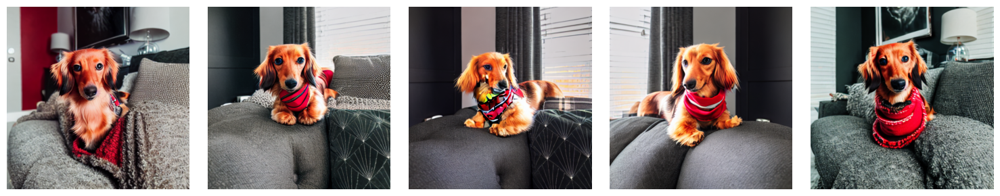

  0%|          | 0/50 [00:00<?, ?it/s]

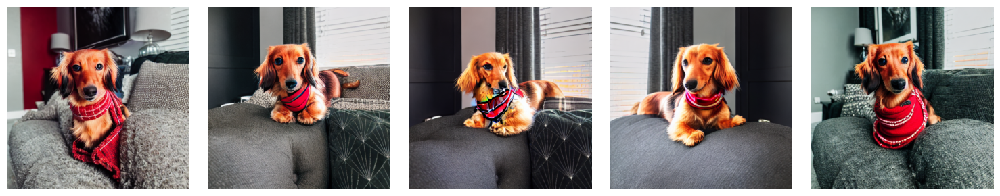

  0%|          | 0/50 [00:00<?, ?it/s]

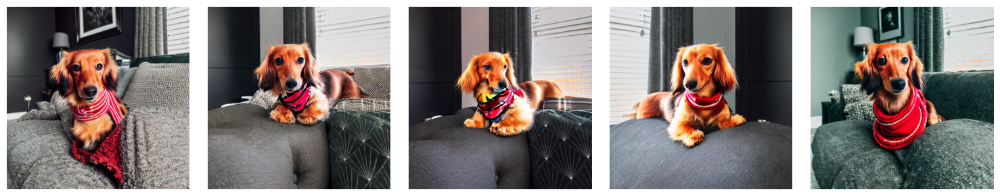

  0%|          | 0/50 [00:00<?, ?it/s]

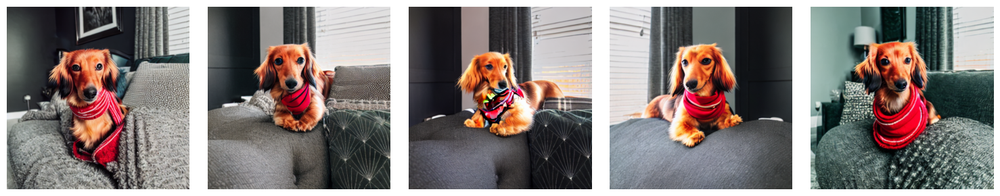

  0%|          | 0/50 [00:00<?, ?it/s]

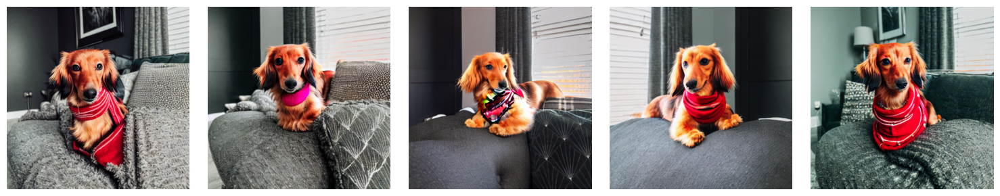

  0%|          | 0/50 [00:00<?, ?it/s]

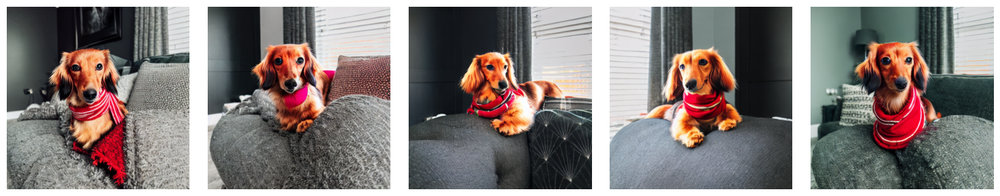

  0%|          | 0/50 [00:00<?, ?it/s]

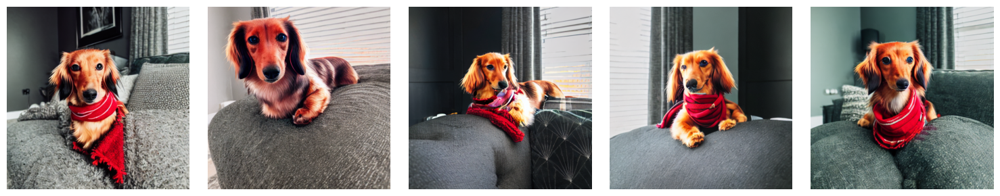

  0%|          | 0/50 [00:00<?, ?it/s]

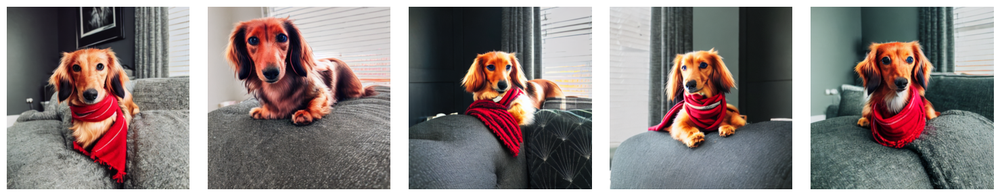

  0%|          | 0/50 [00:00<?, ?it/s]

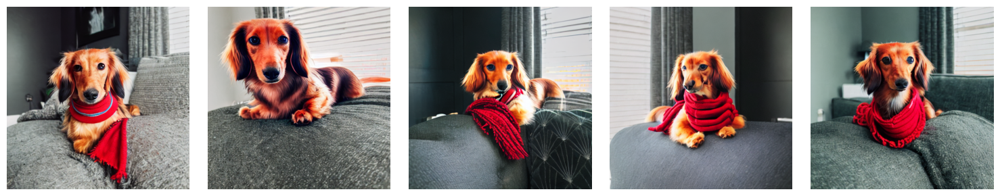

  0%|          | 0/50 [00:00<?, ?it/s]

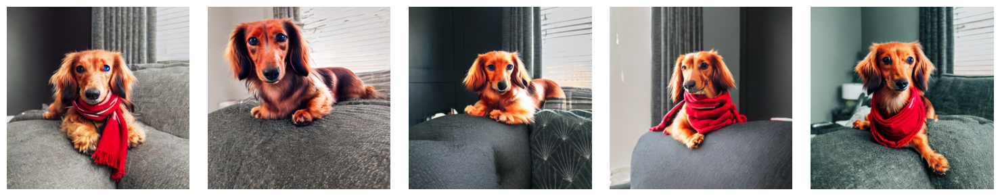

  0%|          | 0/50 [00:00<?, ?it/s]

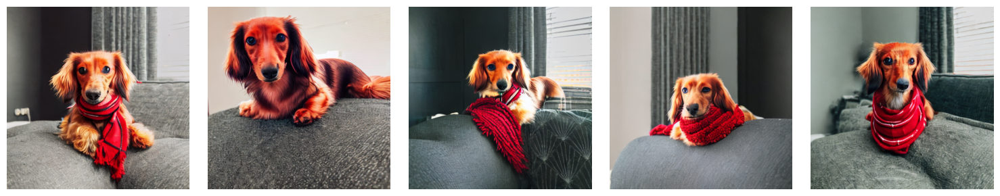

In [6]:
if use_mindiff:
    for i in range(11):
        attn_scale = i / 10
        attn_scale_formatted = str(attn_scale).replace('.', '_')
        MaskAttnProcessor2_0.mask = None
        MaskAttnProcessor2_0.mask_stack = []
        result = pipeline(
            prompt=prompt,
            num_images_per_prompt=num_samples,
            num_inference_steps=num_inference_steps,
            guidance_scale=7.5,
            generator=generator,
            mask_token_id=mask_token_id,
            pre_prompt=pre_prompt,
            attn_scale=attn_scale,
            latents=latents,
        ).images
        fig, axes = plt.subplots(1, 5, figsize=(15,3))
        for i, ax in enumerate(axes):
            ax.imshow(result[i])
            ax.axis('off')
            fig_name = f"./soft-mask-fig/{subject}_{prompt_type}_{mask}_scale_{attn_scale_formatted}_idx_{i}.png"
            result[i].save(fig_name)
        plt.tight_layout()
        plt.show()
else:
    result = pipeline(
        prompt=prompt,
        num_images_per_prompt=num_samples,
        num_inference_steps=num_inference_steps,
        guidance_scale=7.5,
        generator=generator,
        latents=latents,
    ).images
    fig, axes = plt.subplots(1, 5, figsize=(15,3))
    for i, ax in enumerate(axes):
        ax.imshow(result[i])
        ax.axis('off')
        if use_ppl:
            fig_name = f"./soft-mask-fig/{subject}_{prompt_type}_dream_ppl_idx_{i}.png"
        else:
            fig_name = f"./soft-mask-fig/{subject}_{prompt_type}_dream_idx_{i}.png"
        result[i].save(fig_name)
    plt.tight_layout()
    plt.show()

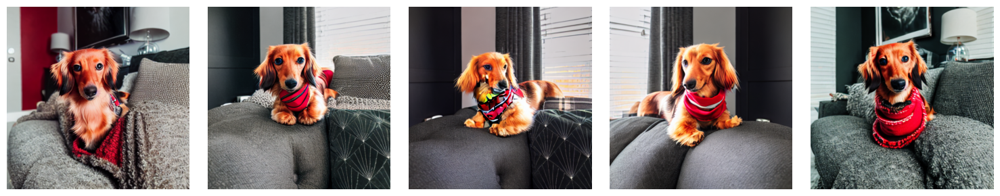

In [7]:
fig, axes = plt.subplots(1, 5, figsize=(15,3))
for i, ax in enumerate(axes):
    ax.imshow(result[i])
    ax.axis('off')
    if use_mindiff:
        fig_name = f"./soft-mask-fig/{subject}_{prompt_type}_{mask}_scale_{attn_scale_formatted}_idx_{i}.png"
    else:
        if use_ppl:
            fig_name = f"./soft-mask-fig/{subject}_{prompt_type}_dream_ppl_idx_{i}.png"
        else:
            fig_name = f"./soft-mask-fig/{subject}_{prompt_type}_dream_idx_{i}.png"
    result[i].save(fig_name)
plt.tight_layout()
plt.show()